In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import sys
from pathlib import Path
module_folder = os.path.abspath('../gridsaliency-original')
if module_folder not in sys.path:
    sys.path.append(module_folder)
from mnist_generators_simple import gen_texture_mnist, plot_samples
scr_folder = os.path.abspath('../scr')
if scr_folder not in sys.path:
    sys.path.insert(1, scr_folder)
from dataloaders import Cityscapes
from metrics import iou_coef, dice_coef, dice_loss
from unet import csbd_unet, manual_unet, TrainUnet
from training_write import TrainingParameters, TrainingResults
from training_plots import plot_predict_and_gt, plot_loss, plot_metric
from seggradcam import SegGradCAM, SuperRoI, ClassRoI, PixelRoI, BiasRoI
import matplotlib.pyplot as plt
from visualize_sgc import SegGradCAMplot

Using TensorFlow backend.


## 2. Option A: Load sets from the path to the original Cityscapes, save the sets to .npz archive

In [2]:
#Path to the dataset
path = "C:\\Users\\vinograd\\Documents\\GitHub\\Seg-Grad-CAM\\inputs\\cityscapes\\leftImg8bit_trainvaltest\\leftImg8bit"

trainparam = TrainingParameters(
epochs = 2,
n_train= 10, #2975 max
n_val = 5 # 500 max #"""
,steps_per_epoch = 10 #1400
    )
trainparam.saveToJson()

trainset = Cityscapes(n = trainparam.n_train, shuffle = True, scale = trainparam.scale, prefix = "train")
valset = Cityscapes(n = trainparam.n_val, shuffle = False, scale = trainparam.scale, prefix = "val")
trainset.get_and_save_npz(path)
valset.get_and_save_npz(path)

Root path:  C:\Users\vinograd\Documents\GitHub\Seg-Grad-CAM\inputs\cityscapes\leftImg8bit_trainvaltest\leftImg8bit\train
Path to images:  <generator object Path.glob at 0x0000026CE4F93990>
Length of the set: 2975 .  10  will be loaded.


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:01<00:00,  8.35it/s]


Root path:  C:\Users\vinograd\Documents\GitHub\Seg-Grad-CAM\inputs\cityscapes\leftImg8bit_trainvaltest\leftImg8bit\val
Path to images:  <generator object Path.glob at 0x0000026CE53EB200>
Length of the set: 500 .  5  will be loaded.


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00,  8.37it/s]


## 3.A Train Unet from scratch

In [5]:
trainunet = TrainUnet(trainparam)
trainunet.csbdUnet()
fit_out = trainunet.fit_generator(trainset,valset)

trainingResults = TrainingResults(trainparam, fit_out)
trainingResults.modelSummaryTxt()
trainingResults.writeResultsTxt()

Epoch 1/2
10/10 [==============================] - ETA: 2:24 - loss: 2.2879 - acc: 0.1744 - iou_coef: 0.0709 - dice_coef: 0.13 - ETA: 1:11 - loss: 2.0974 - acc: 0.2558 - iou_coef: 0.0863 - dice_coef: 0.15 - ETA: 45s - loss: 1.9966 - acc: 0.3468 - iou_coef: 0.0968 - dice_coef: 0.1758 - ETA: 32s - loss: 1.9951 - acc: 0.3529 - iou_coef: 0.0993 - dice_coef: 0.180 - ETA: 23s - loss: 1.9473 - acc: 0.3851 - iou_coef: 0.1064 - dice_coef: 0.191 - ETA: 16s - loss: 1.9263 - acc: 0.3986 - iou_coef: 0.1107 - dice_coef: 0.198 - ETA: 11s - loss: 1.8926 - acc: 0.4093 - iou_coef: 0.1159 - dice_coef: 0.206 - ETA: 7s - loss: 1.8747 - acc: 0.4164 - iou_coef: 0.1206 - dice_coef: 0.214 - ETA: 3s - loss: 1.8464 - acc: 0.4226 - iou_coef: 0.1249 - dice_coef: 0.22 - 148s 15s/step - loss: 1.7934 - acc: 0.4455 - iou_coef: 0.1327 - dice_coef: 0.2324 - val_loss: 3.4630 - val_acc: 0.0695 - val_iou_coef: 0.0493 - val_dice_coef: 0.0934
Epoch 2/2
10/10 [==============================] - ETA: 15s - loss: 1.5947 - acc: 0

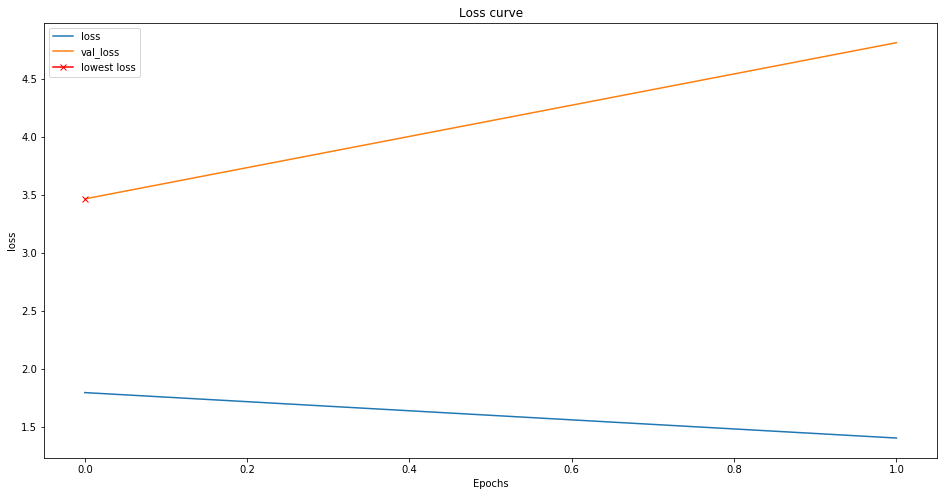

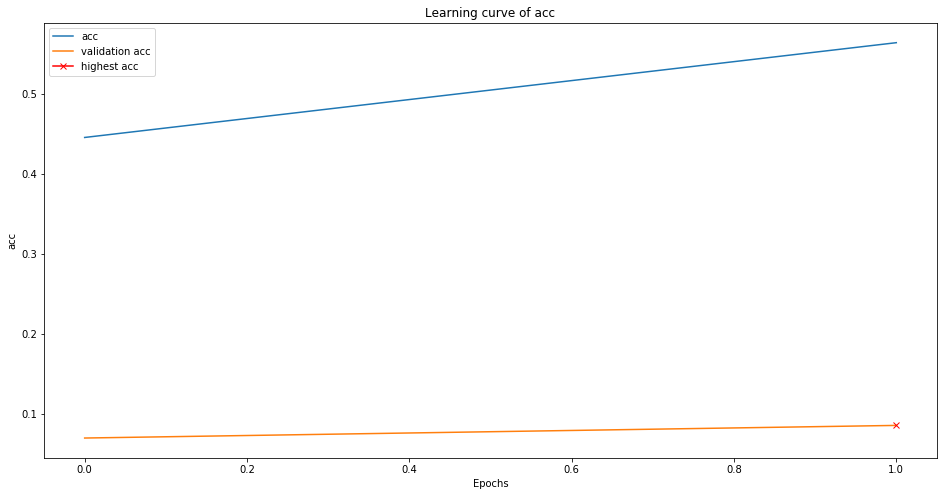

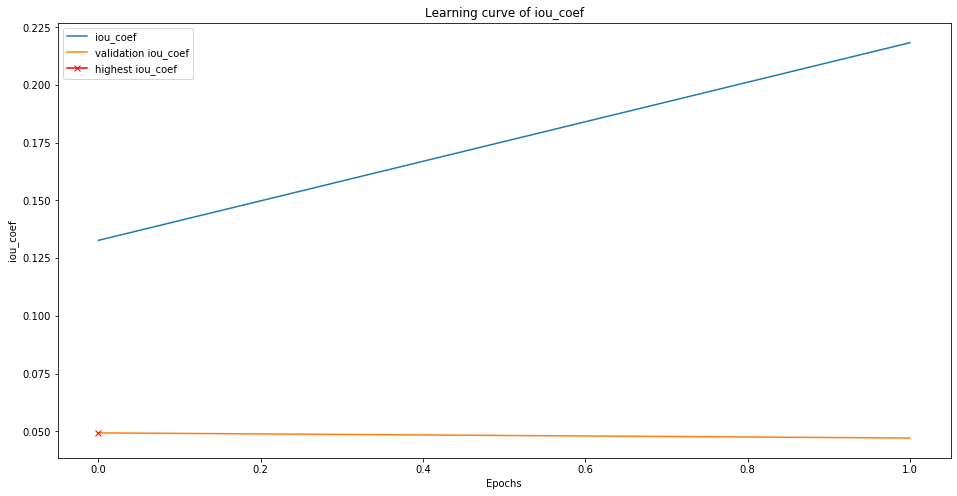

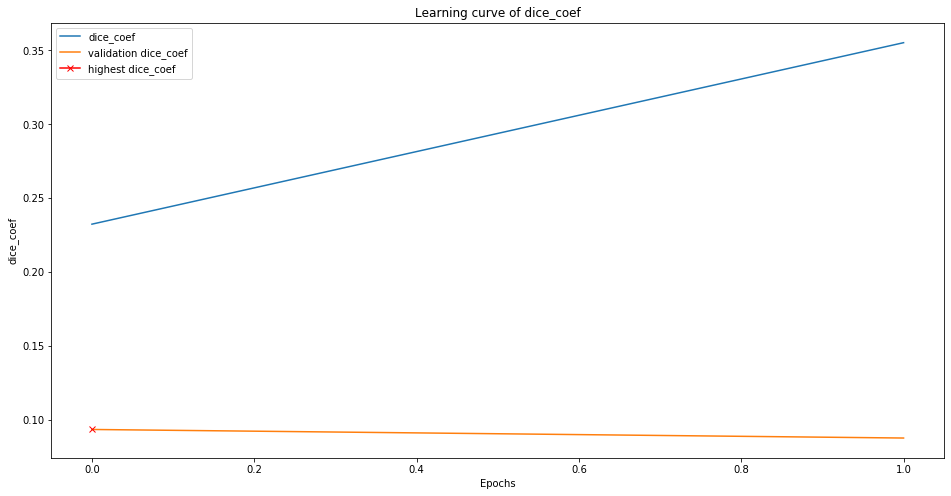

In [9]:
# save few predictions to the folder
str_folder = str(trainparam.outfolder)
# plot loss and other metrics
plot_loss(fit_out,  str_folder)
plot_metric(trainparam.metrics, fit_out, str_folder)


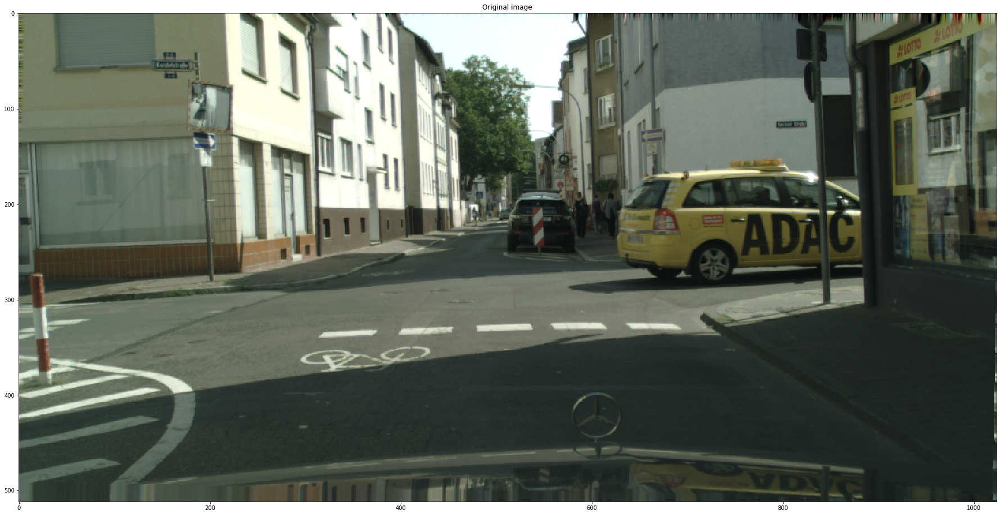

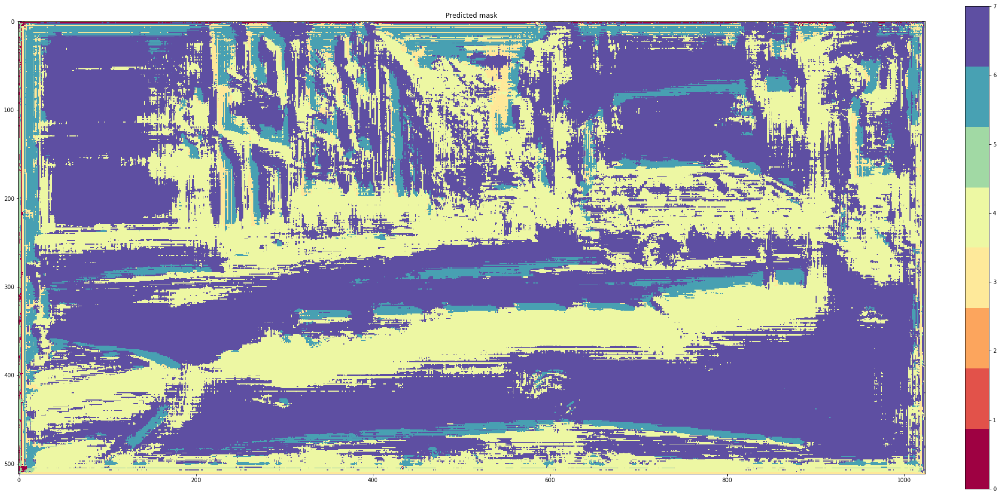

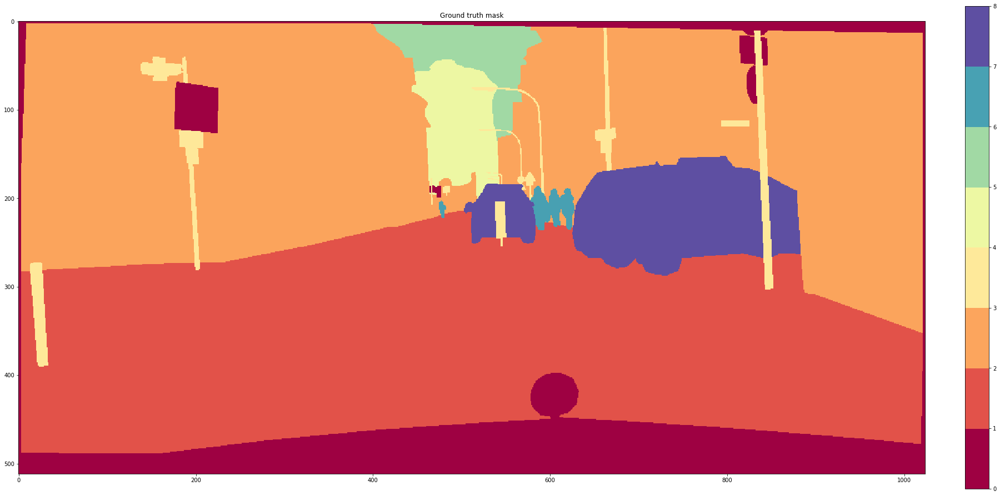

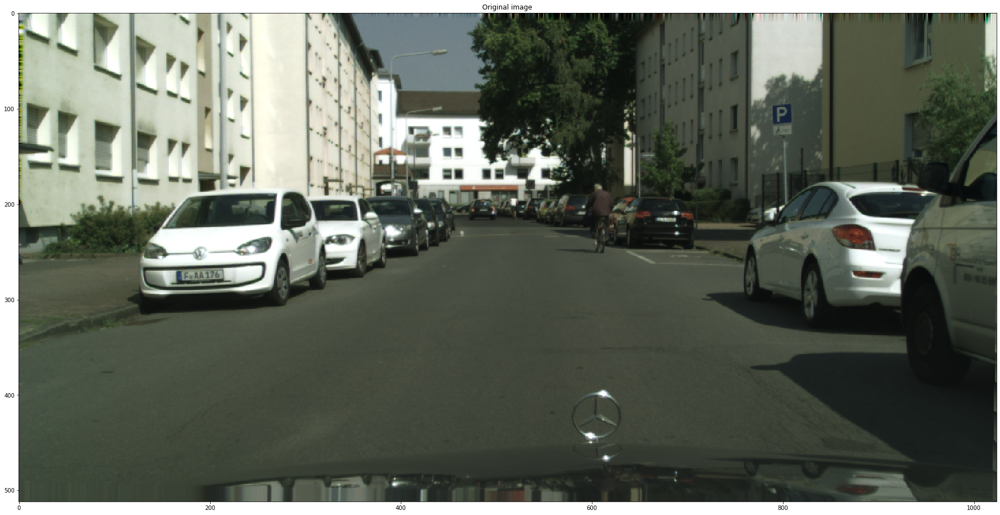

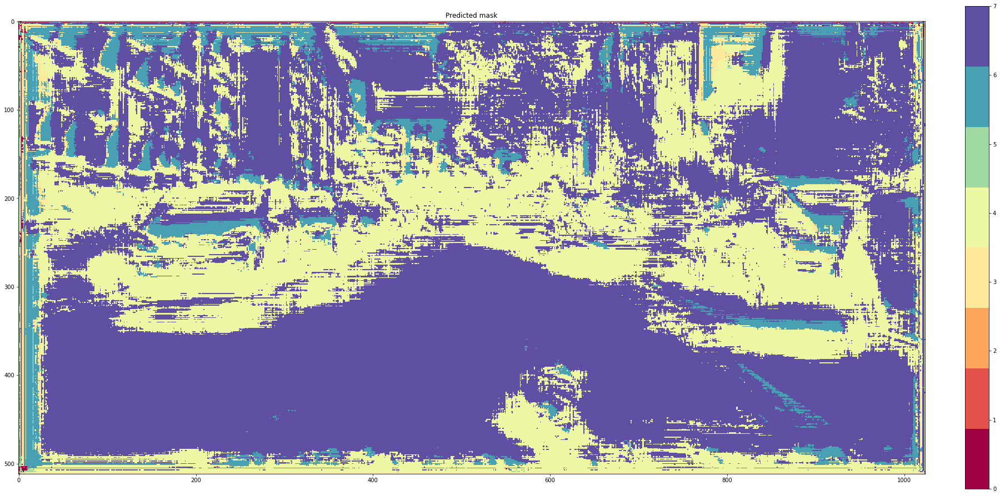

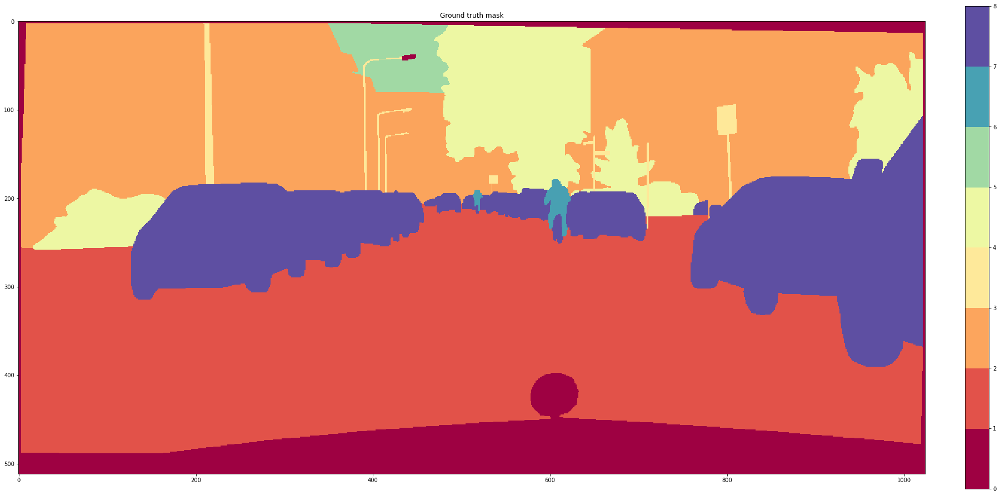

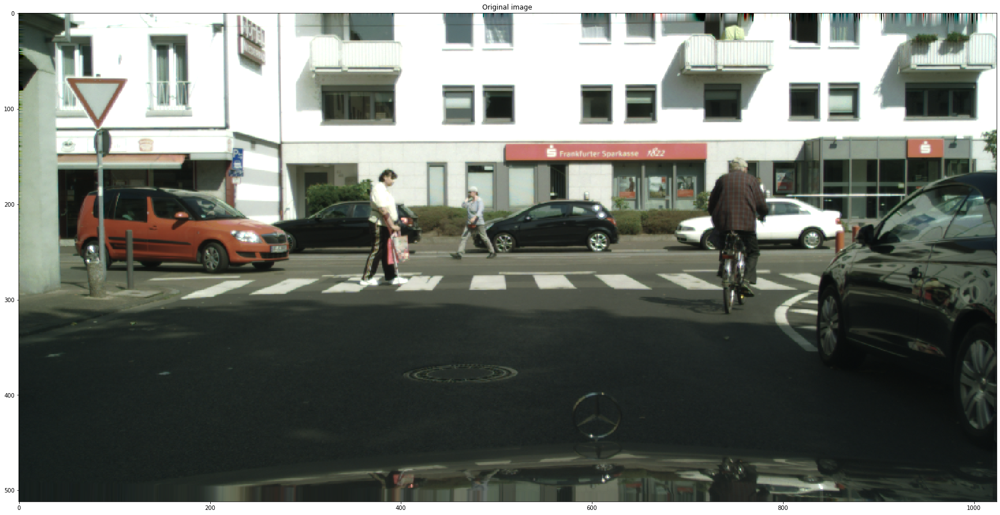

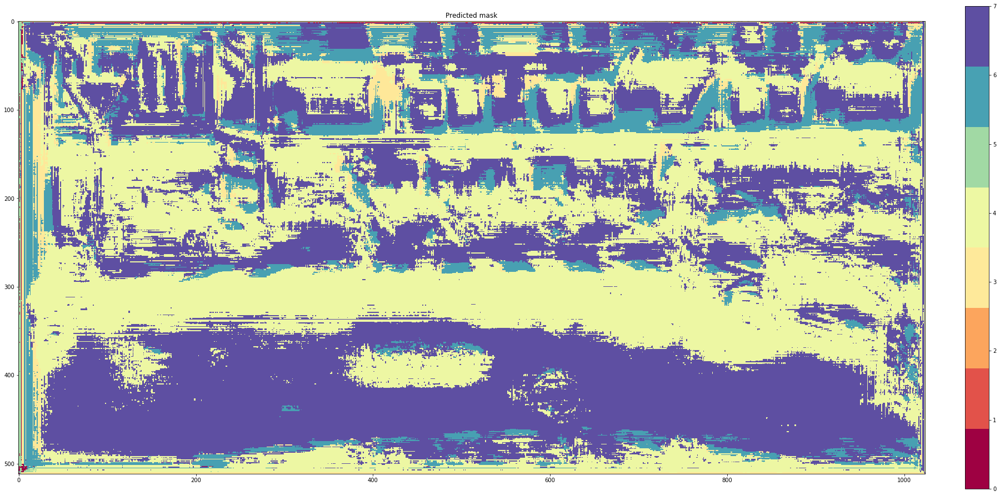

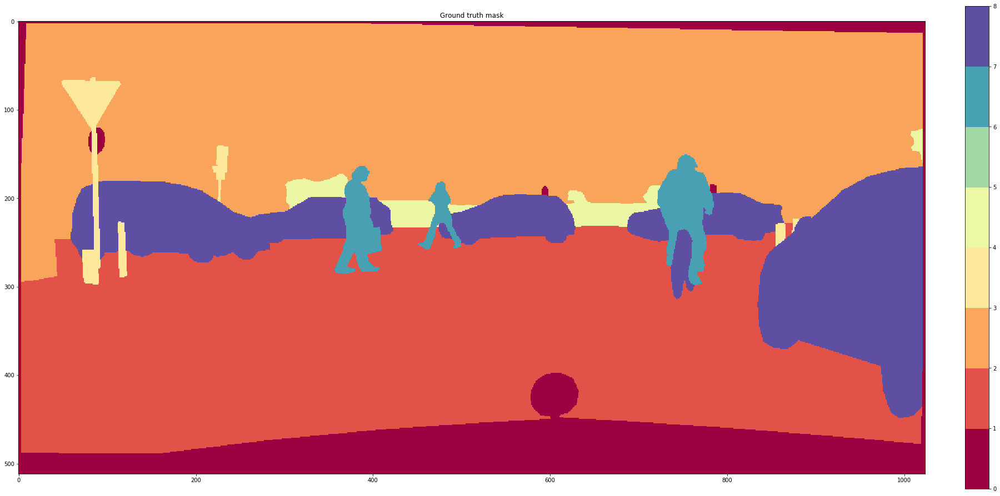

In [11]:
# plot predictions
plot_predict_and_gt(trainunet.model, valset.X, valset.Y, range(3), str_folder, trainparam.n_classes)

In [6]:
trainparam.outfolder

WindowsPath('../../output/Cityscapes/06_25_00_53_fil32_depth4_lr0.0003_scale2_batch2')

In [4]:
trainset.outfile

'..\\..\\inputs\\cityscapes\\saved_npz\\scale2_cl8_n10_shuffleTrue_train.npz'

In [3]:
valset.outfile

'..\\..\\inputs\\cityscapes\\saved_npz\\scale2_cl8_n5_shuffleFalse_val.npz'

## Option B: load prepared sets from archives

In [2]:
trainparam = TrainingParameters(
epochs = 2,
n_train= 10, #2975 max
n_val = 5 # 500 max #"""
,steps_per_epoch = 10 #1400
    # this the folder for the saved experiment, the model's weights are stored there
    ,outfolder = Path('../../output/Cityscapes/06_25_00_53_fil32_depth4_lr0.0003_scale2_batch2')
    )
# paths to archives are generated automatically according to the datasets' parameters
trainset = Cityscapes(n = trainparam.n_train, shuffle = True, scale = trainparam.scale, prefix = "train")
valset = Cityscapes(n = trainparam.n_val, shuffle = False, scale = trainparam.scale, prefix = "val")
trainset.load_npz()
valset.load_npz()

## Create a Unet object and load weights

In [3]:
trainunet = TrainUnet(trainparam)
trainunet.csbdUnet()
trainunet.compile()
trainunet.load_weights()

In [4]:
b_necks = trainunet.findBottleneck()
prop_from_layer = trainunet.model.layers[-1].name
prop_to_layer = b_necks[1]

activations in b-neck:  9 , 10


In [8]:
cls = 0
imid = 0 # id of the image in its batch
image = trainset.X[imid]

Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 1276 1276


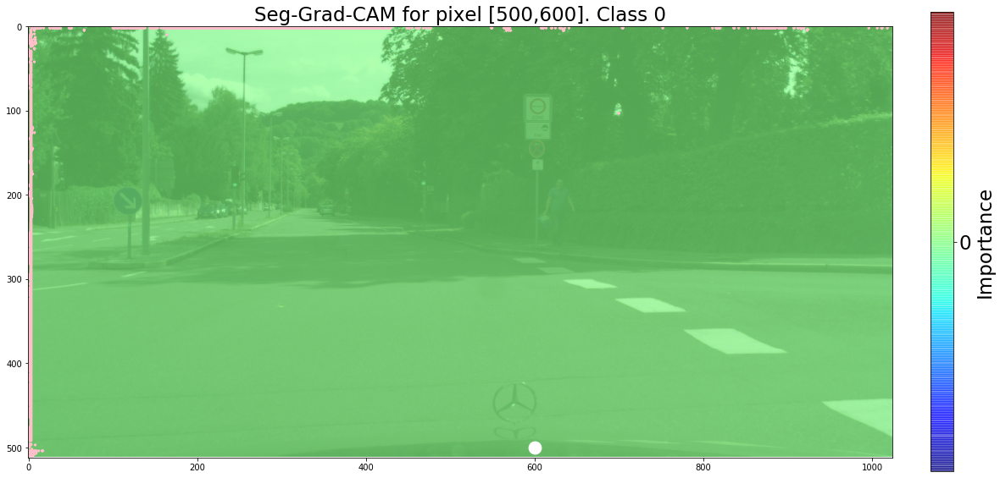

In [15]:
# create a SegGradCAM object
from visualize_sgc import SegGradCAMplot
pixsgc = SegGradCAM(trainunet.model, image, cls,  prop_to_layer,prop_from_layer, roi=PixelRoI(500,600,image),
                 normalize=True, abs_w=False, posit_w=False)
# compute SegGradCAM
pixsgc.SGC()
# create an object with plotting functionality
plotter = SegGradCAMplot(pixsgc,trainunet, gt = trainset.Y[imid])
# plot explanations on 1 picture
plotter.explainPixel()

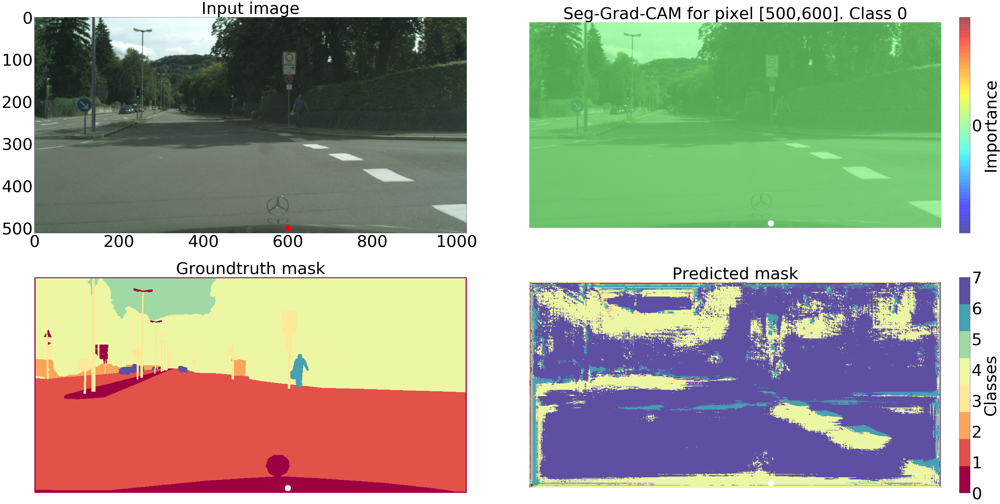

In [16]:
#Plot 4 images: original, ground truth, predicted mask, seg-grad-cam explanations for a selected single pixel
plotter.pixelGtPrediction()

Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 1276 1276


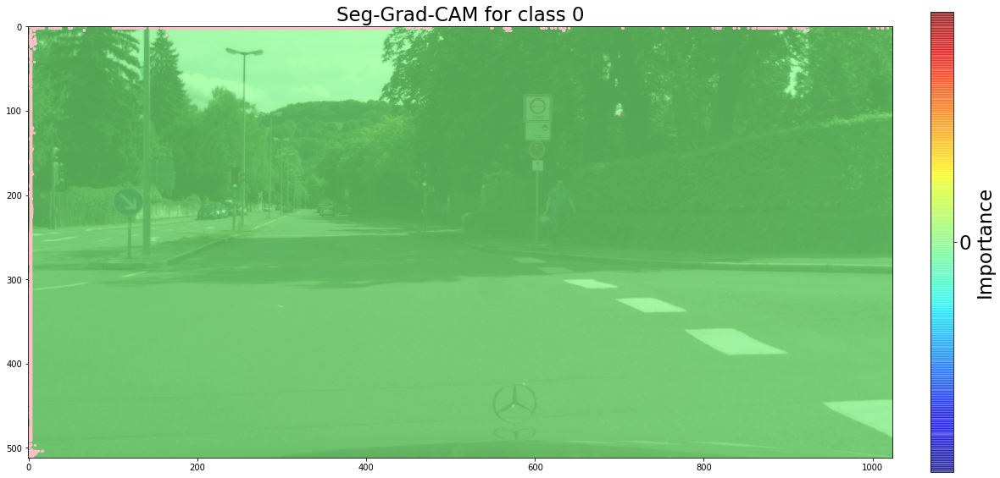

In [19]:
clsroi = ClassRoI(trainunet.model,image,cls)
clssgc = SegGradCAM(trainunet.model, image, cls,  prop_to_layer,prop_from_layer, roi=clsroi,
                 normalize=True, abs_w=False, posit_w=False)
clssgc.SGC()
clsplotter = SegGradCAMplot(clssgc,trainunet, gt=trainset.Y[imid])
clsplotter.explainClass()

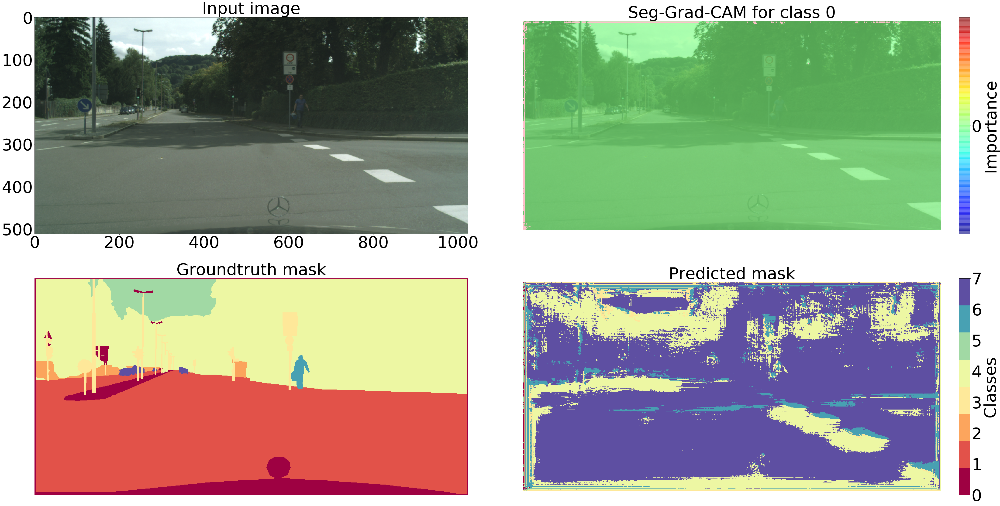

In [20]:
clsplotter.classGtPrediction()

Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 32218 32218
connectedComponents values, counts:  [   0    1    2 ... 1055 1056 1057] [492070      2      2 ...      3    308      2]
argmax:  66
Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 6075 6075


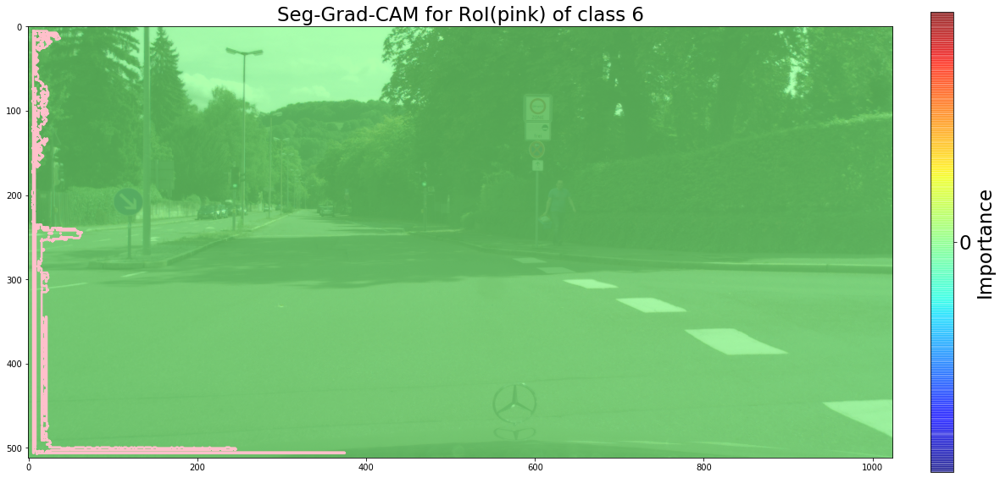

In [21]:
cls = 6
largeroi = ClassRoI(trainunet.model,image,cls)
# find the largest connected component of pixels predicted as 'cls'
largeroi.largestComponent()

largesgc = SegGradCAM(trainunet.model, image, cls,  prop_to_layer,prop_from_layer, roi=largeroi,
                 normalize=True, abs_w=False, posit_w=False)
largesgc.SGC()
roiplotter = SegGradCAMplot(largesgc,trainunet,gt=trainset.Y[imid])
roiplotter.explainRoi()

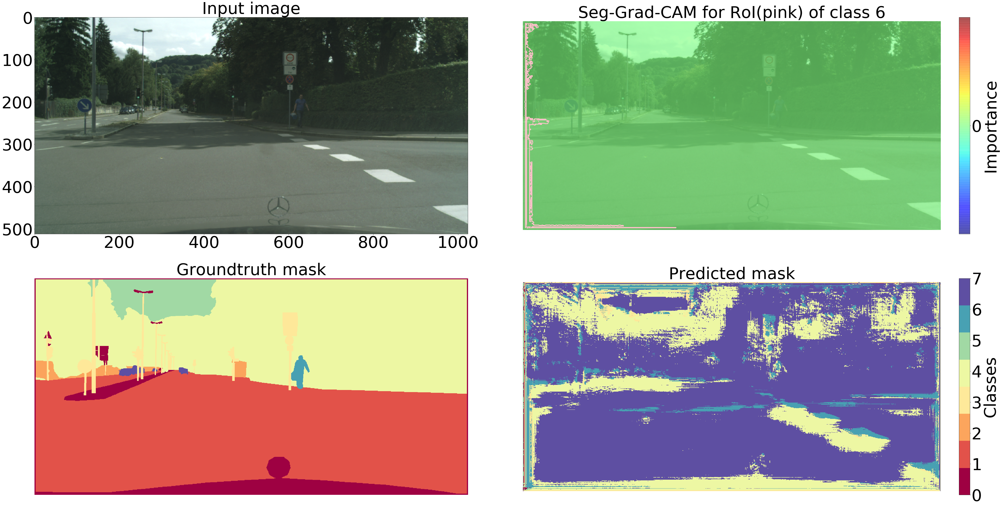

In [22]:
roiplotter.roiGtPrediction()

Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 32218 32218
connectedComponents values, counts:  [   0    1    2 ... 1055 1056 1057] [492070      2      2 ...      3    308      2]
argmin:  3
Shape of RoI:  (512, 1024)
Lengths of i and j index lists: 1 1


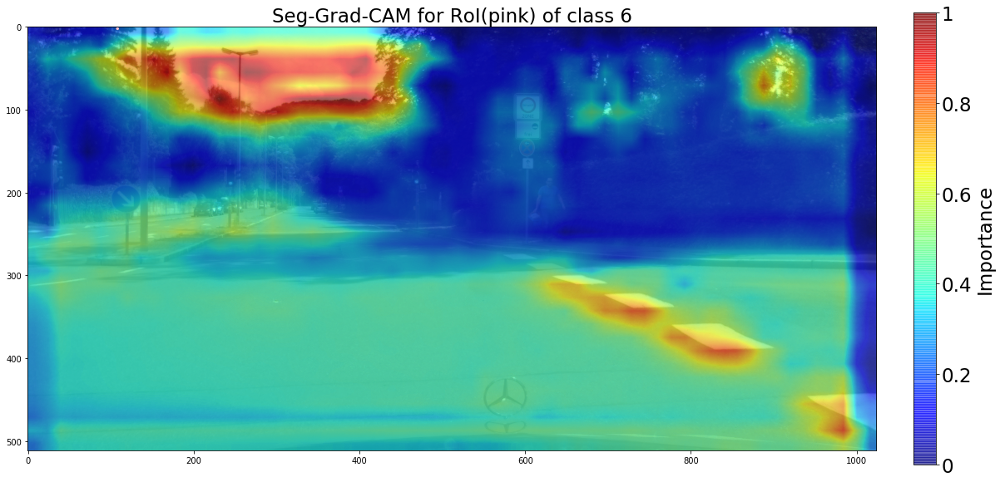

In [24]:
smallroi = ClassRoI(trainunet.model,image,cls)
# Now, for the smallest component
smallroi.smallestComponent()

smallsgc = SegGradCAM(trainunet.model, image, cls,  prop_to_layer,prop_from_layer, roi=smallroi,
                 normalize=True, abs_w=False, posit_w=False)
smallsgc.SGC()
smallroiplotter = SegGradCAMplot(smallsgc,trainunet,gt=trainset.Y[imid])
smallroiplotter.explainRoi()

In [ ]:
# one pixel on the top: [0,170-ish]